In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import math
import numpy as np
import xlsxwriter
from openpyxl import load_workbook

from ipynb.fs.full.UtilFunctions import spearman_rank_corr, format_season, merge_standings
from ipynb.fs.full.UtilCollections import SEASONS, PARAMS, CURRENT_TEAMS

In [2]:
pylab.rcParams.update(PARAMS)

In [11]:
def calculate_rank_corr_by_team_stat(df, eastern_standings, western_standings, stat):
    
    corr_df = df.sort_values(by=[stat, 'Team'], ascending=[False, True])
    
#     corr_df.set_index('Team', inplace=True)
    
    teams = list(corr_df.index)
    rank = range(1, 31)
    zip_iterator = zip(teams, rank)

    teams_ordered_by_stat = dict(zip_iterator)
    
    standings = merge_standings(eastern_standings, western_standings)
        
    rank1 = []
    rank2 = []
    for team in CURRENT_TEAMS:
        if team in standings:
            rank1.append(teams_ordered_by_stat[team])
            rank2.append(standings[team])

    return spearman_rank_corr(rank1, rank2)

In [4]:
def rank_team_corrs_to_excel(dfs, eastern_standings_dfs, western_standings_dfs, stat):
    corrs = [stat]
    
    n = len(dfs)
    
    for i in range(n):
        corrs.append(calculate_rank_corr_by_team_stat(dfs[i], eastern_standings_dfs[i], western_standings_dfs[i], stat))
        
    wb = load_workbook("DataCollection/Correlation/Rank_Correlation_bench_Players_Stats.xlsx")
    ws = wb.worksheets[0]
    
    ws.append(corrs)
    wb.save("DataCollection/Correlation/Rank_Correlation_bench_Players_Stats.xlsx")

In [5]:
def get_csvs_by_season(season):
    first_year, second_year = format_season(season)
    
    player_df = pd.read_csv("DataCollection/Player_Stats/player_stats_{0}-{1}.csv".format(first_year, second_year))
    team_df = pd.read_csv("DataCollection/Team_Stats/team_stats_{0}-{1}.csv".format(first_year, second_year))
    adv_team_df = pd.read_csv("DataCollection/Advanced_Team_Stats/adv_team_stats_{0}-{1}.csv".format(first_year, second_year))
    opponent_df = pd.read_csv("DataCollection/Opponent_Stats/opponent_stats_{0}-{1}.csv".format(first_year, second_year))
    eastern_standings_df = pd.read_csv("DataCollection/Standings/standings_eastern_conference_{0}-{1}.csv".format(first_year, second_year))
    western_standings_df = pd.read_csv("DataCollection/Standings/standings_western_conference_{0}-{1}.csv".format(first_year, second_year))
    
    return player_df, team_df, adv_team_df, opponent_df, eastern_standings_df, western_standings_df

In [6]:
def get_playoff_csvs_by_season(season):
    first_year, second_year = format_season(season)
    
    player_df = pd.read_csv("DataCollection/Player_Stats_Playoffs/player_stats_playoffs_{0}-{1}.csv".format(first_year, second_year))    
#     standings_df = pd.read_csv("DataCollection/Standings_Playoffs/playoff_standings_{0}-{1}.csv".format(first_year, second_year))
    
    return player_df#, standings_df

In [7]:
player_dfs, team_dfs, adv_team_dfs, opponent_dfs, eastern_standings_dfs, western_standings_dfs = [], [], [], [], [], []

for season in SEASONS:
    player_df, team_df, adv_team_df, opponent_df, eastern_standings_df, western_standings_df = get_csvs_by_season(season)
    player_dfs.append(player_df)
    team_dfs.append(team_df)
    adv_team_dfs.append(adv_team_df)
    opponent_dfs.append(opponent_df)
    eastern_standings_dfs.append(eastern_standings_df)
    western_standings_dfs.append(western_standings_df)

In [10]:
bench_per_season = []

for i in range(len(SEASONS)):    
    games_in_season = team_dfs[i]["G"][0]
    df = player_dfs[i].sort_values(by=['Tm', 'GS'], ascending=[True, False])
    df.insert(len(df.columns), "Count", 0)
    cols = df.columns    
    bench = pd.DataFrame(columns = cols)
    for team in CURRENT_TEAMS:
        bench_players = pd.DataFrame(df[df["Tm"] == team][5:])
        bench_players = bench_players[bench_players["G"] > games_in_season/2]
        number_of_qualifying_reserves = bench_players.shape[0]
        bench_players = bench_players.mean()
        bench_players["Count"] = number_of_qualifying_reserves
        bench.loc[team] = bench_players

    bench.drop(["Player", "Pos", "Tm"], axis=1, inplace=True)
    bench.index.names = ["Team"]
    bench_per_season.append(bench)

In [12]:
calculate_rank_corr_by_team_stat(pd.DataFrame(bench_per_season[18]["MP"]), eastern_standings_dfs[18], western_standings_dfs[18], "MP")

-0.4416017797552836

In [13]:
stats = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P',
       '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PER', 'TS%', '3PAr', 'FTr', 'ORB%',
       'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS',
       'WS', 'WS/48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'Salary', 'Count']

bench_avg_per_season = {}


for stat in stats:
    bench_avg_per_season[stat] = []
    for df in bench_per_season:
        bench_avg_per_season[stat].append(df[stat].mean())

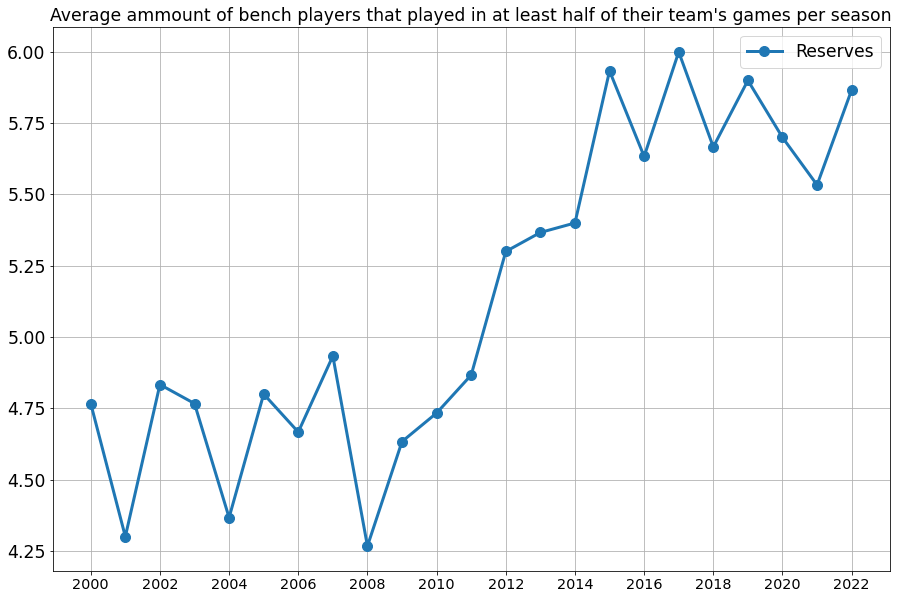

In [16]:
plt.figure(figsize=(15,10))
plt.grid()
plt.plot(SEASONS, bench_avg_per_season["Count"], label="Reserves", lw=3, marker='o', ms=10)
plt.xticks(SEASONS[::2])
plt.title(f"Average ammount of bench players that played in at least half of their team's games per season")
plt.legend()
plt.show()

In [27]:
bench_corr = pd.read_excel("DataCollection/Correlation/Rank_Correlation_bench_Players_Stats.xlsx")
bench_corr.set_index("Stat", inplace=True)
bench_corr

,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Stat,,,,,,,,,,,,,,,,,,,
Age,0.612315,0.540394,0.252948,0.539043,0.448276,0.117686,0.062514,0.208899,0.583982,0.496774,0.486541,0.732147,0.567964,0.354839,0.306340,0.189766,0.133704,0.247164,0.553726
G,0.128079,0.336946,0.122581,0.227141,0.375306,0.138598,0.440712,0.273860,0.556841,0.265406,0.540378,0.222692,0.440267,0.259177,0.459399,0.131924,0.297887,0.490990,0.392214
GS,-0.365517,-0.573399,-0.425139,-0.466073,-0.305451,-0.692547,-0.521691,-0.450056,-0.440267,-0.607119,-0.373081,-0.520356,-0.478532,-0.544383,-0.372191,-0.566185,-0.485651,-0.216908,-0.394438
MP,-0.322167,-0.345813,-0.484316,-0.412236,-0.104783,-0.474527,-0.325028,-0.117686,0.171969,-0.367297,-0.143493,-0.529255,-0.336596,-0.197330,-0.403782,-0.441602,-0.264961,-0.236040,-0.604004
FG,-0.244828,-0.092611,-0.473192,-0.349499,-0.166185,-0.281869,-0.192436,-0.181313,0.018465,-0.413126,-0.195106,-0.284983,0.090545,-0.307230,-0.258287,-0.490990,-0.303671,-0.147052,-0.476307
FGA,-0.385714,-0.214286,-0.503448,-0.354394,-0.136819,-0.393548,-0.188877,-0.266296,-0.027809,-0.475862,-0.299221,-0.374861,-0.019355,-0.412681,-0.352169,-0.535929,-0.346830,-0.162625,-0.508343
FG%,0.240394,0.170936,0.273860,-0.097664,-0.038932,0.397998,0.114572,0.139488,0.144828,0.120356,0.340156,0.301446,0.147052,0.349499,0.323248,0.186652,0.147942,-0.026474,-0.106118
3P,-0.118719,0.024631,-0.241379,0.174638,0.361513,-0.034483,0.196440,0.195996,0.167075,0.284538,0.198665,0.328142,0.150612,-0.185762,-0.071413,-0.204894,0.248498,0.239155,0.279199
3PA,-0.187685,-0.007389,-0.224027,0.211123,0.357953,-0.058954,0.167075,0.090990,0.152392,0.252058,0.102558,0.262736,0.103893,-0.220912,-0.113237,-0.220022,0.179088,0.062514,0.083426


In [28]:
starters_corr = pd.read_excel("DataCollection/Correlation/Rank_Correlation_Starters_Stats.xlsx")
starters_corr.set_index("Stat", inplace=True)
starters_corr

,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Stat,,,,,,,,,,,,,,,,,,,
Age,0.368473,0.376847,0.294772,0.471413,0.537709,0.443382,0.436263,0.546162,0.459844,0.303226,0.451390,0.495884,0.405562,0.364182,0.304116,0.414016,0.619577,0.633370,0.429143
G,0.117241,0.550739,0.406897,0.338821,0.435373,0.558176,0.245829,0.189321,0.187987,0.353949,0.327697,0.266296,0.503893,0.201780,0.190211,0.432703,0.521691,0.447831,0.582647
GS,0.397044,0.705911,0.539043,0.531034,0.488765,0.642269,0.632481,0.555951,0.559956,0.720578,0.503893,0.477642,0.759733,0.552392,0.468743,0.546162,0.709900,0.659177,0.579088
MP,0.198522,0.064039,0.307675,0.255617,0.094994,0.233370,-0.168409,0.004672,0.056285,0.463404,0.224027,0.221357,0.352169,0.024694,0.228476,0.343270,0.456730,0.089655,-0.001557
FG,0.440887,-0.001478,0.347720,0.305451,0.285873,0.305895,0.076307,0.384650,0.272080,0.545717,0.372191,0.229811,0.388209,0.355284,0.236485,0.473637,0.533704,0.255172,0.299221
FGA,0.222167,-0.149754,0.265406,0.164850,0.138598,0.144828,-0.243604,0.017130,-0.050945,0.406897,0.090990,-0.104338,0.037152,0.144383,0.170634,0.282759,0.485651,0.138598,0.026919
FG%,0.458128,0.444828,0.408231,0.511457,0.249833,0.449166,0.567964,0.513682,0.507008,0.505673,0.461624,0.682314,0.708565,0.422469,0.504338,0.587097,0.278754,0.511012,0.446941
3P,0.364532,-0.081281,0.498999,0.113237,0.066073,0.404227,0.094994,0.228031,0.103003,0.022024,0.342825,0.038487,0.419800,0.484761,0.249388,0.396218,0.353504,0.052725,0.094549
3PA,0.352217,-0.146305,0.461624,0.125695,0.007341,0.410901,-0.011791,0.188877,0.042047,-0.083871,0.240489,-0.058509,0.327697,0.399333,0.101224,0.287208,0.332592,0.022024,-0.014905


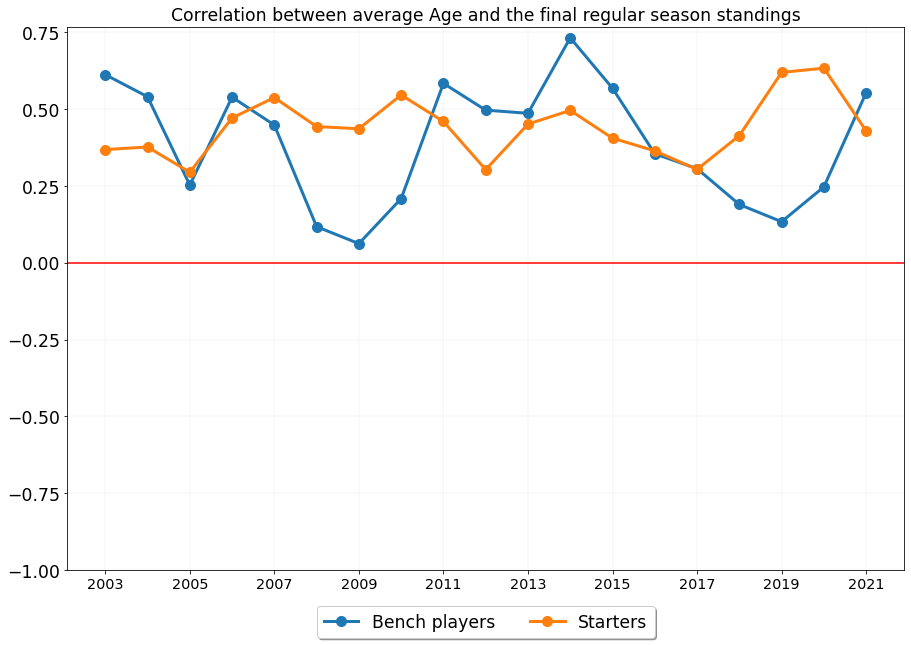

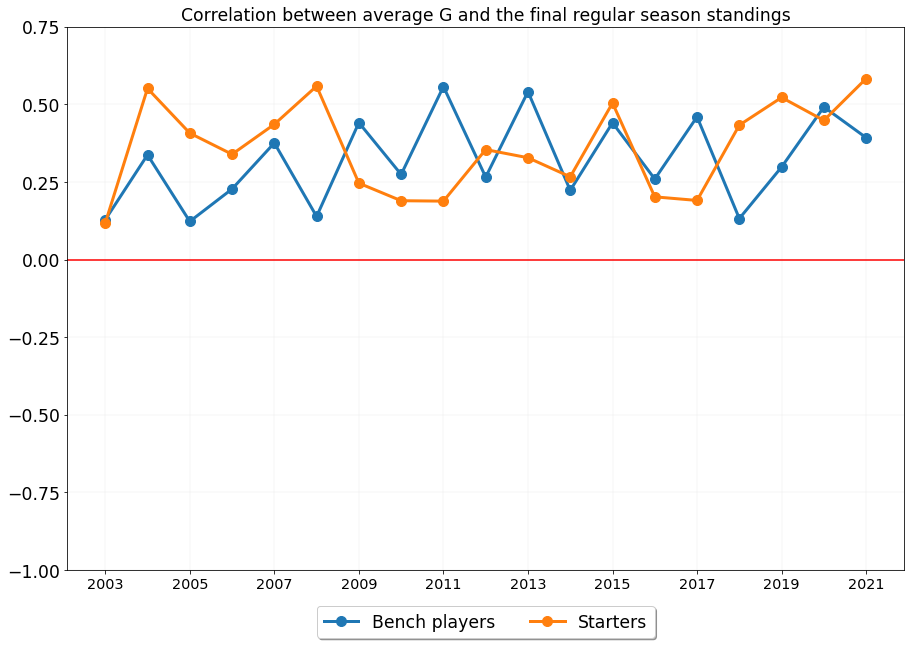

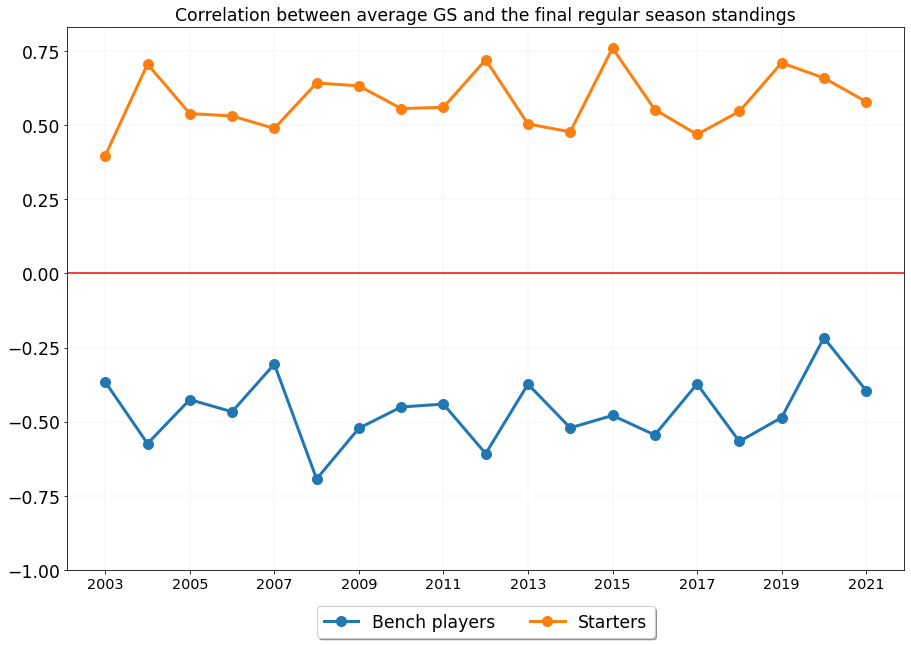

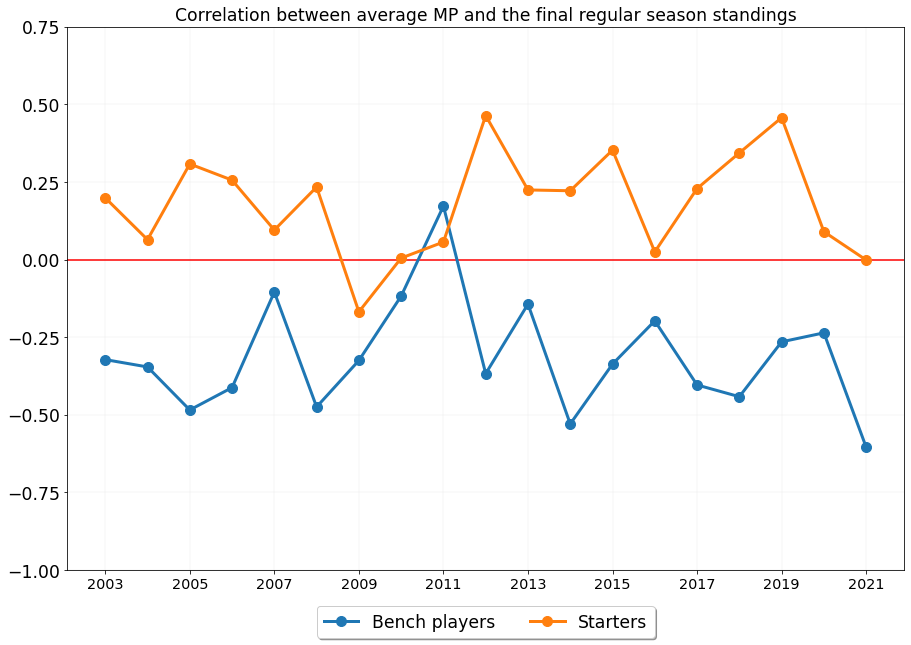

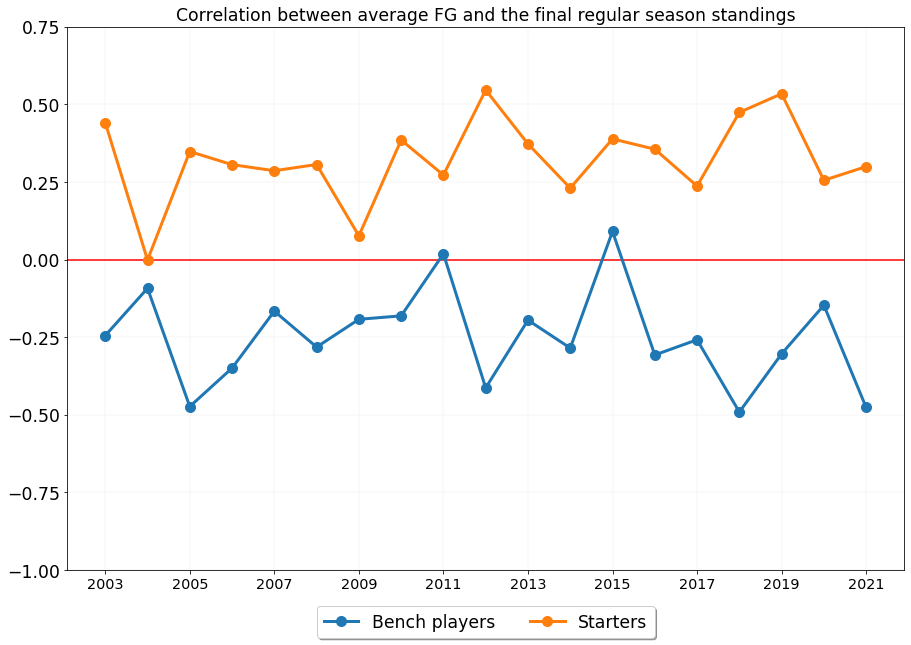

...

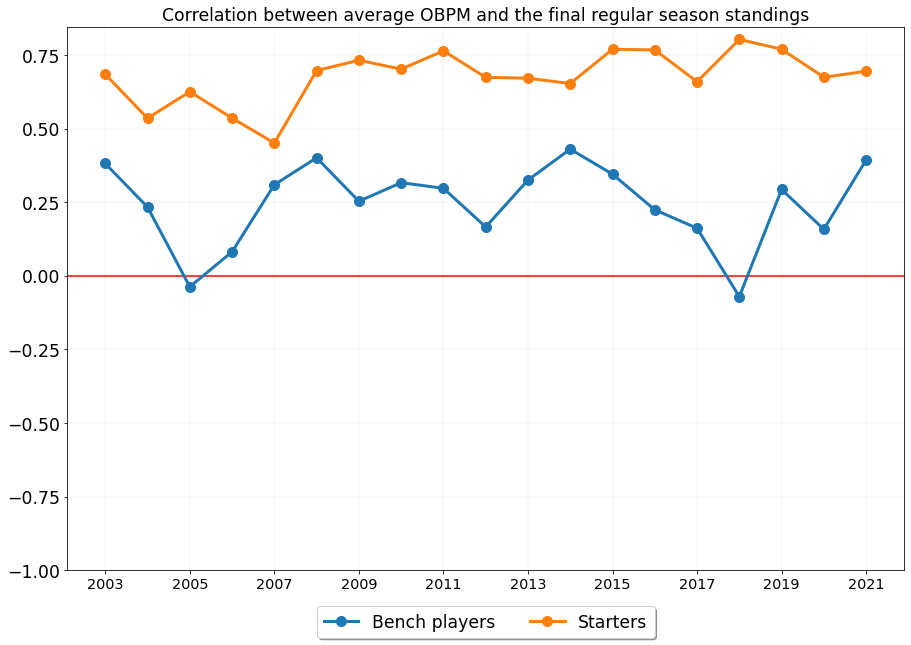

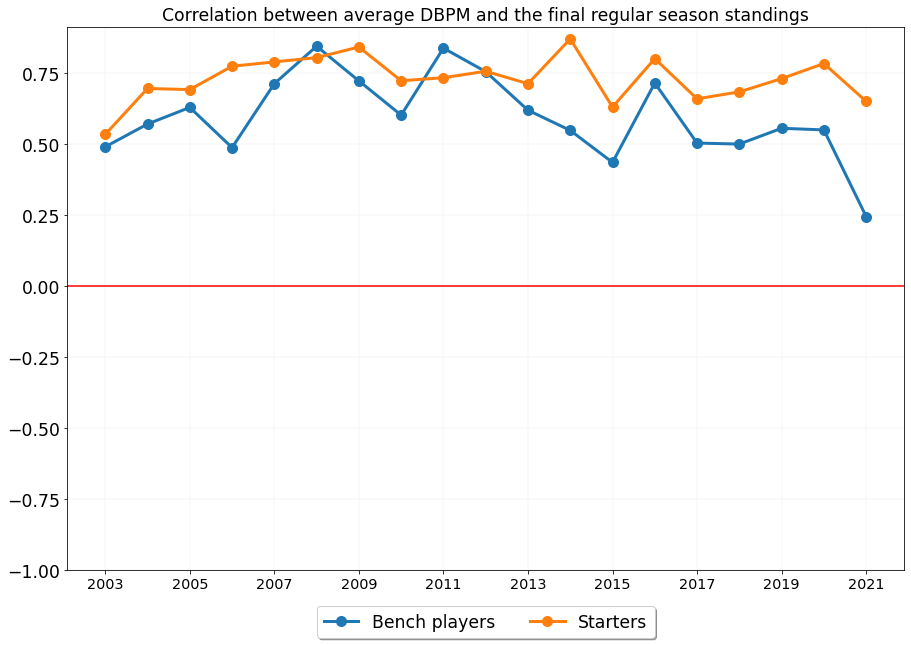

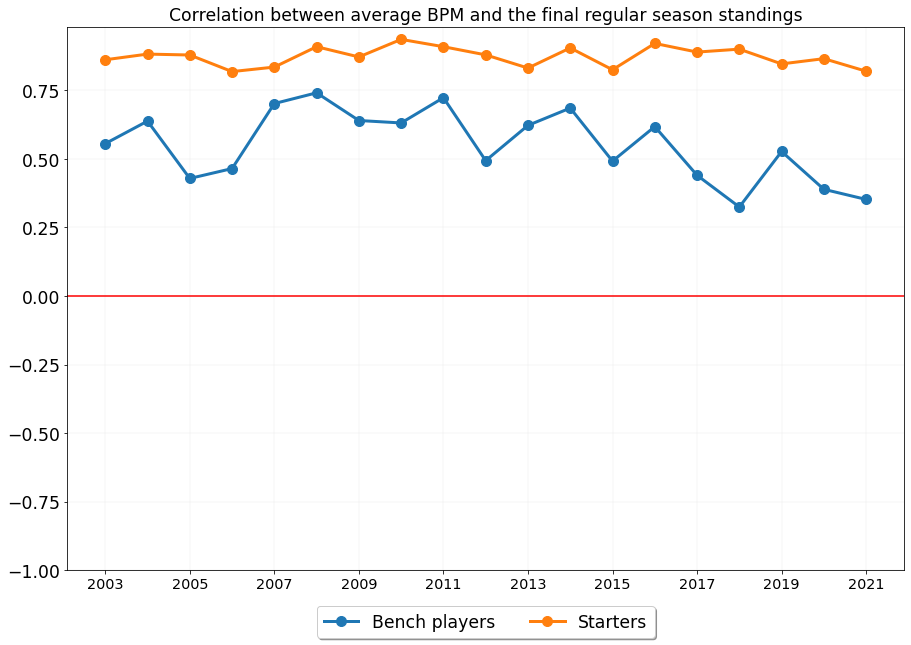

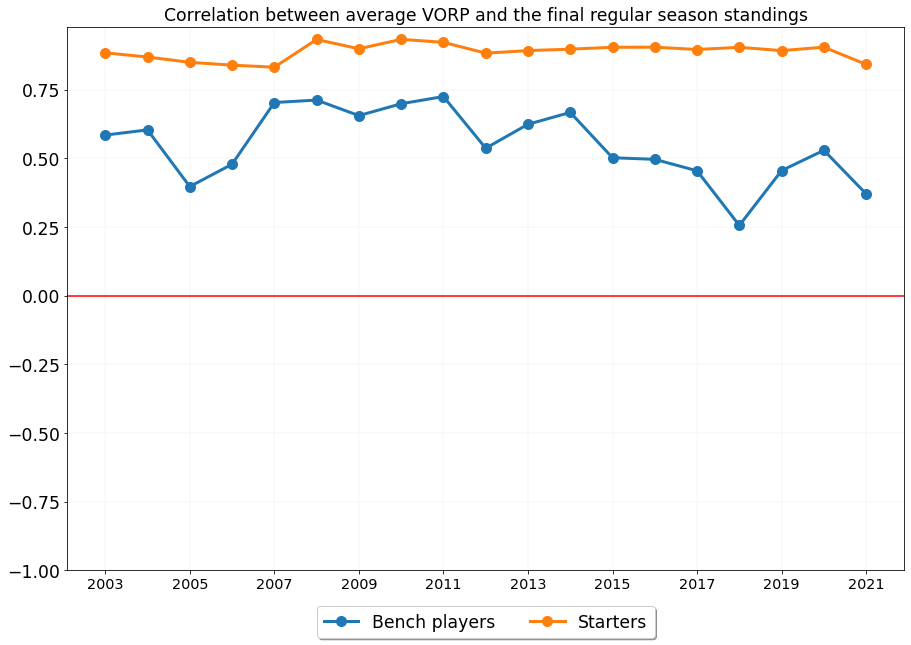

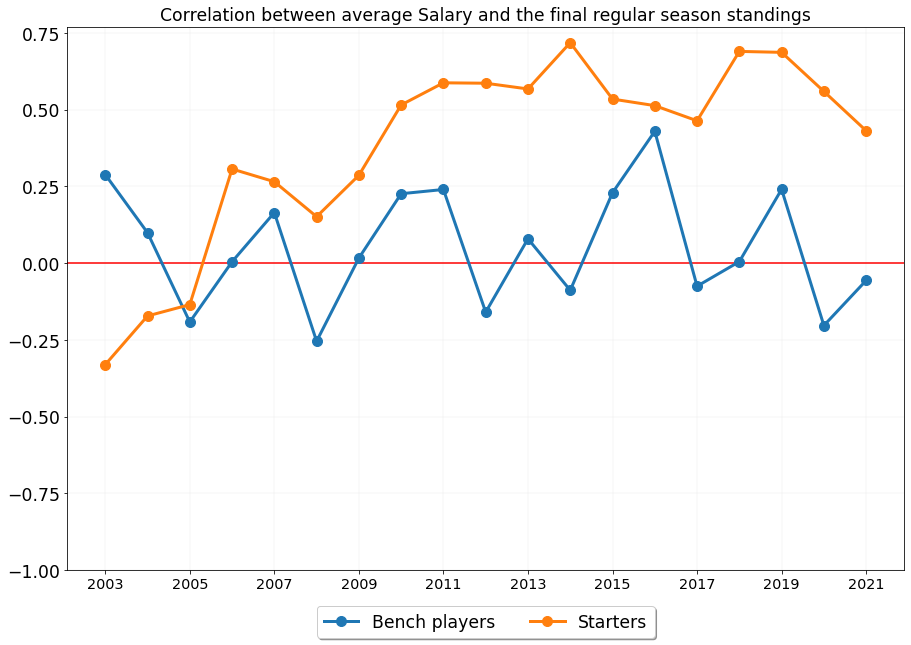

In [37]:
for stat in starters_corr.index:
    plt.figure(figsize=(15,10))
    plt.axhline(y=0.0, color='r', linestyle='-')
    plt.grid(lw=0.1)
    plt.plot(SEASONS[3:-1], bench_corr.loc[stat], lw=3, marker='o', ms=10, label="Bench players")
    plt.plot(SEASONS[3:-1], starters_corr.loc[stat], lw=3, marker='o', ms=10, label="Starters")
    plt.xticks(SEASONS[3:-1:2])
    plt.yticks(np.arange(-1.0, 1.0, 0.25))
    plt.title(f"Correlation between average {stat} and the final regular season standings")
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5)
    plt.show()
    

# Starter Analysys

In [39]:
starters_per_season = []

for i in range(len(SEASONS)):    
    df = player_dfs[i].sort_values(by=['Tm', 'GS'], ascending=[True, False])
    cols = df.columns    
    starters_df = pd.DataFrame(columns = cols)
    for team in CURRENT_TEAMS:
        starters = pd.DataFrame(df[df["Tm"] == team][:5])
        starters = starters.mean()
        starters_df.loc[team] = starters

    starters_df.drop(["Player", "Pos", "Tm"], axis=1, inplace=True)
    starters_df.index.names = ["Team"]
    starters_per_season.append(starters_df)

In [40]:
starter_stats = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P',
       '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PER', 'TS%', '3PAr', 'FTr', 'ORB%',
       'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS',
       'WS', 'WS/48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'Salary']

starter_avg_per_season = {}


for stat in starter_stats:
    starter_avg_per_season[stat] = []
    for df in starters_per_season:
        starter_avg_per_season[stat].append(df[stat].mean())

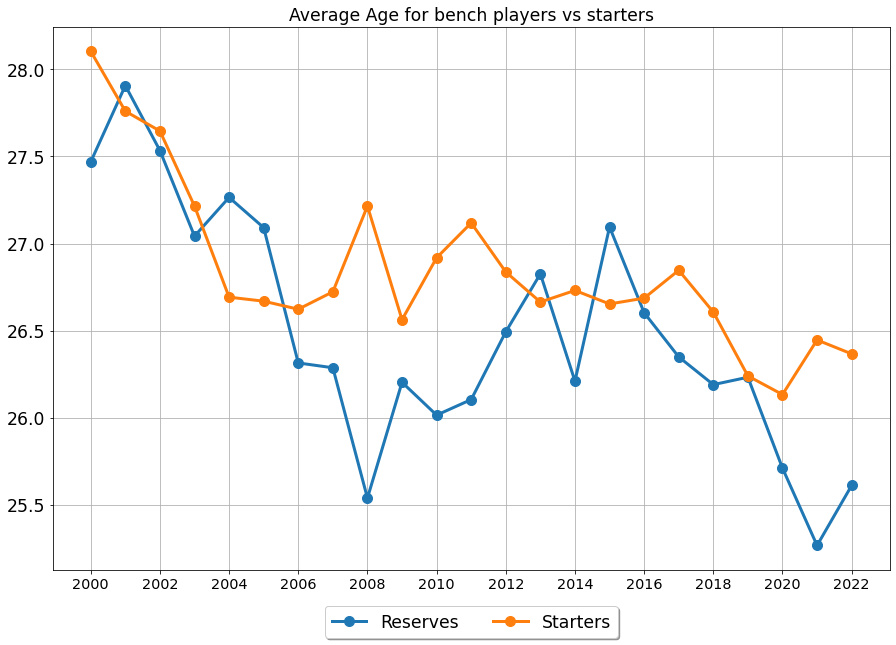

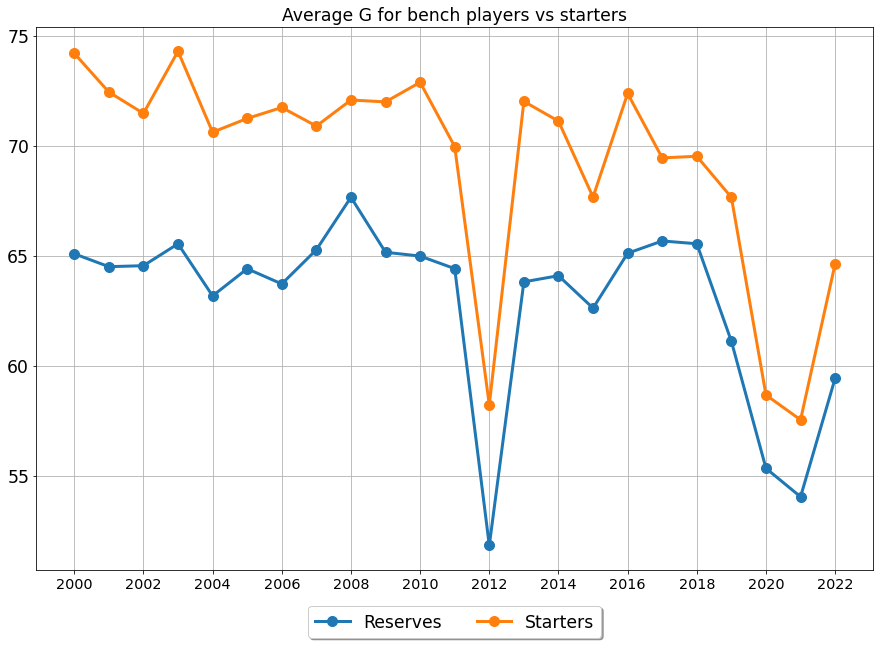

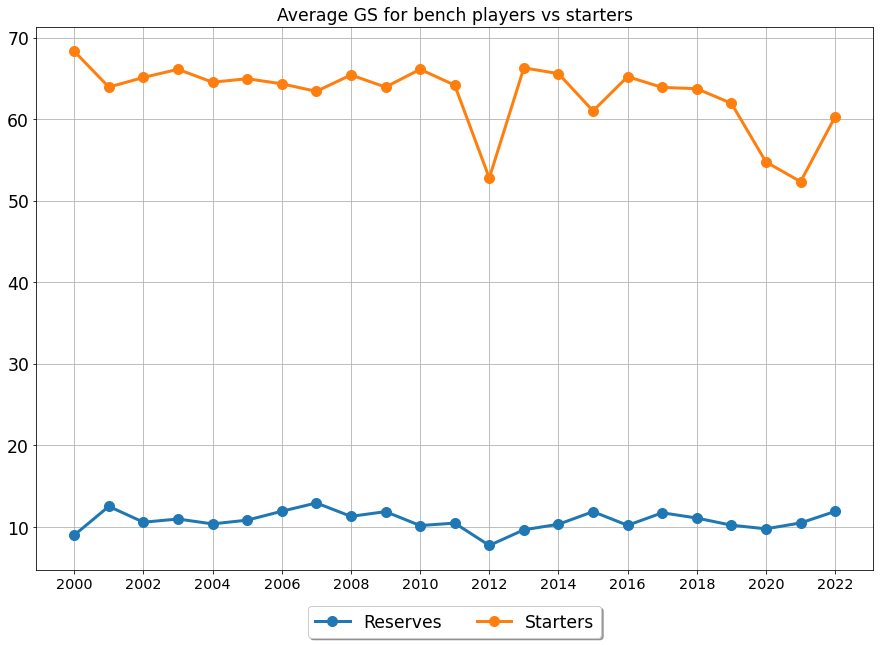

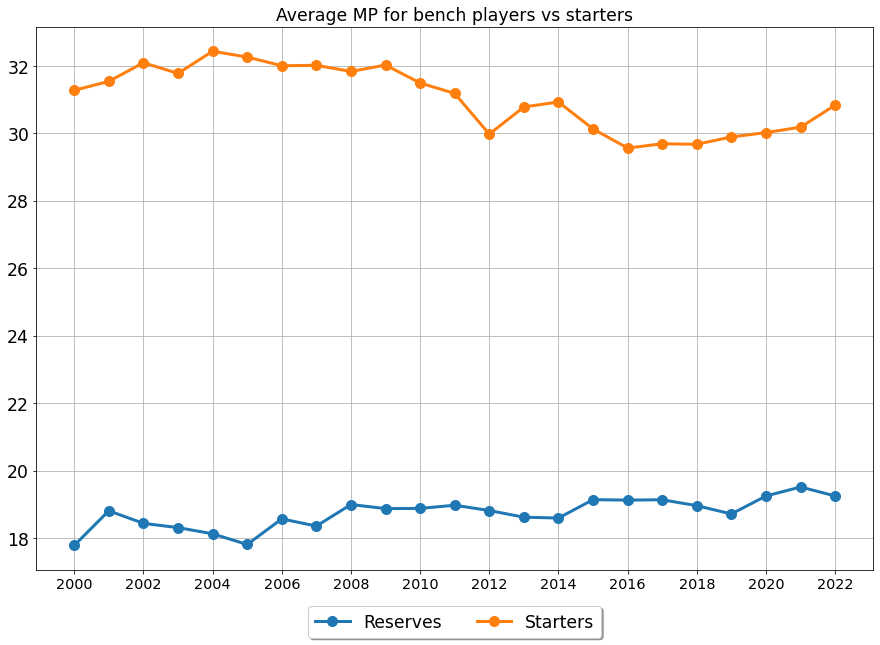

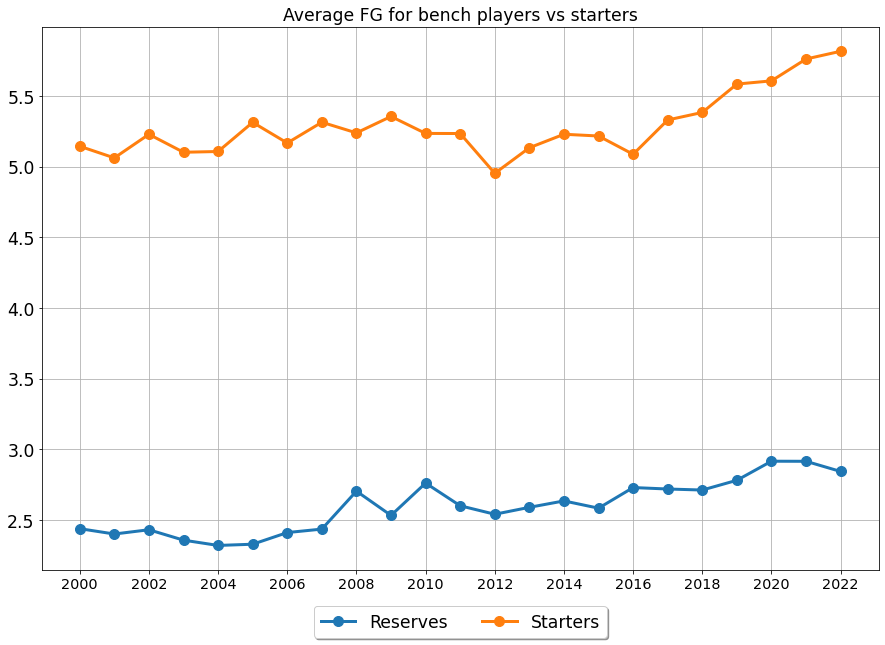

...

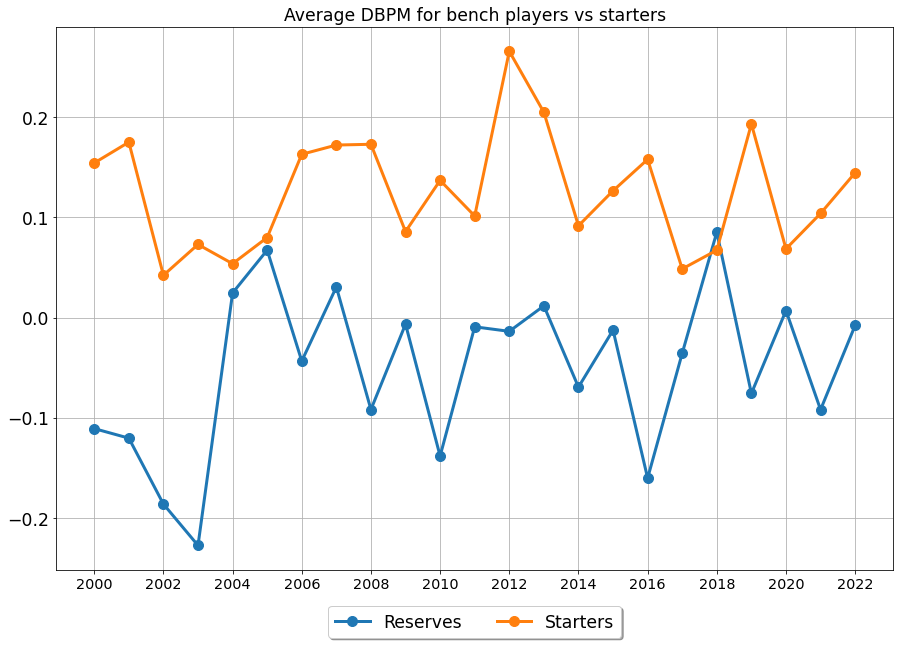

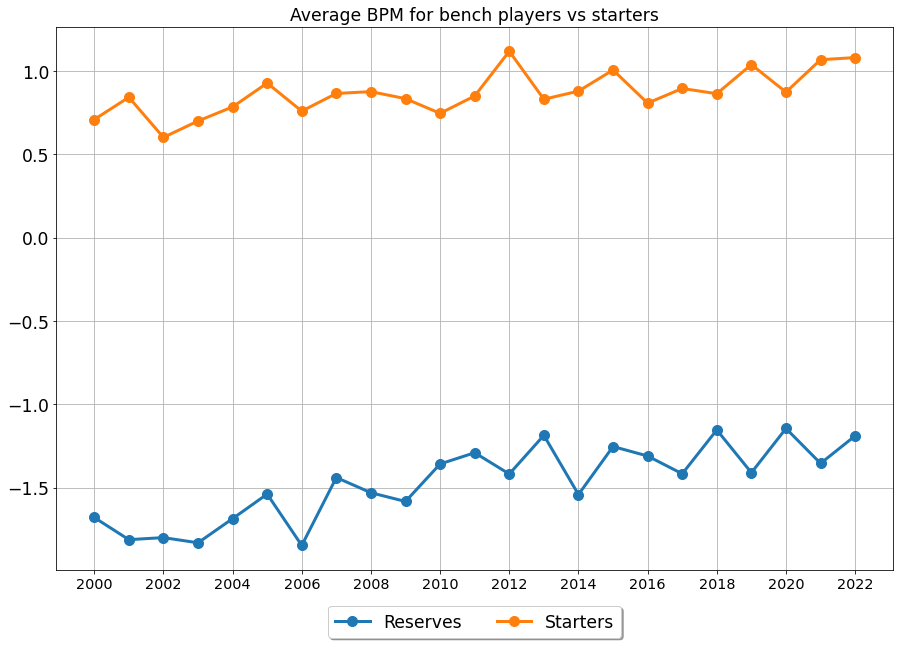

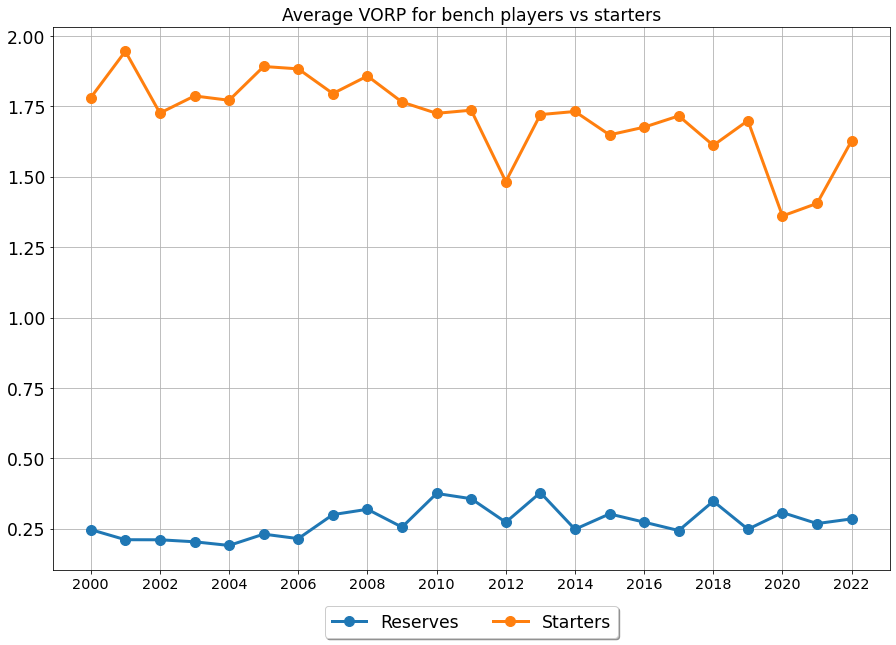

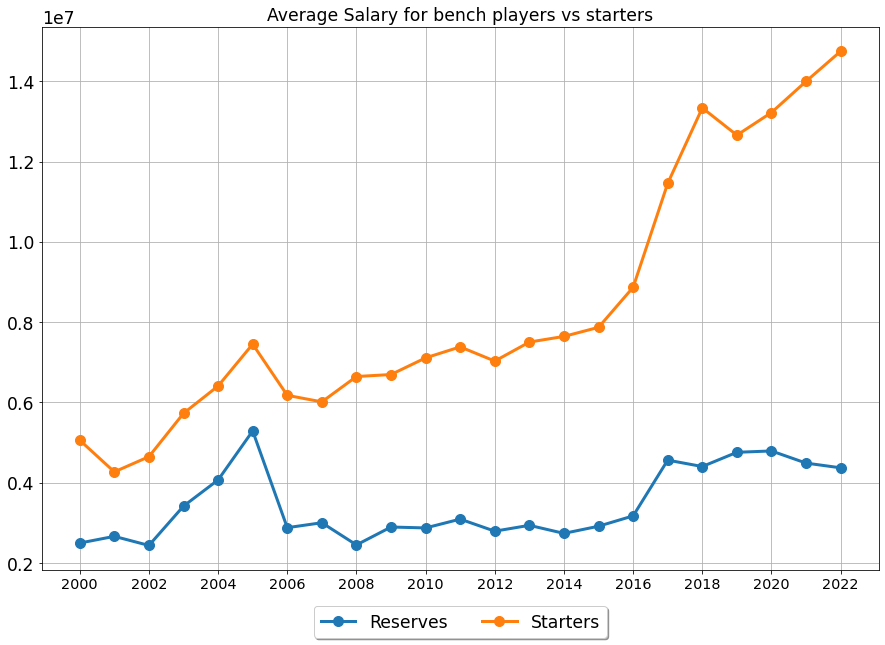

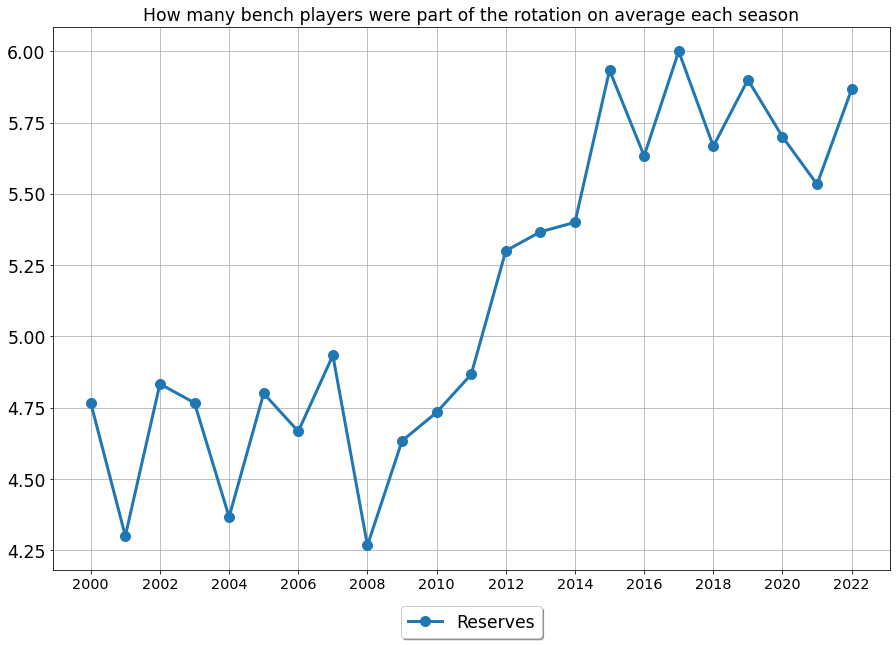

In [42]:
for stat in bench_avg_per_season:
    plt.figure(figsize=(15,10))
    plt.grid()
    plt.plot(SEASONS, bench_avg_per_season[stat], label="Reserves", lw=3, marker='o', ms=10)
    plt.title(f"How many bench players were part of the rotation on average each season")

    if stat != "Count":
        plt.plot(SEASONS, starter_avg_per_season[stat], label="Starters", lw=3, marker='o', ms=10)
        plt.title(f"Average {stat} for bench players vs starters")
        
    plt.xticks(SEASONS[::2])
        
    if '/' in stat:
        stat = stat.replace('/', '_')
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=2)
    if stat == 'Count':
        plt.savefig(f"Results/DepthEvolution/{stat}_starters_and_reserves_each_season")
    plt.show()

# From now on, the analysys will focus on playoff stats

In [43]:
playoff_player_dfs = []

for season in SEASONS:
    playoff_player_df = get_playoff_csvs_by_season(season)
    playoff_player_dfs.append(playoff_player_df)
#     playoff_standings_dfs.append(playoff_standings_df)
    

In [45]:
bench_per_playoff = []

for i in range(len(SEASONS)):    
    df = playoff_player_dfs[i].sort_values(by=['Tm', 'GS'], ascending=[True, False])
    df.insert(len(df.columns), "Count", 0)
    cols = df.columns    
    bench = pd.DataFrame(columns = cols)
    for team in CURRENT_TEAMS:
        bench_players = pd.DataFrame(df[df["Tm"] == team][5:])
        bench_players = bench_players[bench_players["G"] >= 2]
        number_of_qualifying_reserves = bench_players.shape[0]
        bench_players = bench_players.mean()
        if number_of_qualifying_reserves > 0:
            bench_players["Count"] = number_of_qualifying_reserves
        bench.loc[team] = bench_players

    bench.drop(["Player", "Pos", "Tm"], axis=1, inplace=True)
    bench.dropna(how='all', inplace=True)
    bench.index.names = ["Team"]
    bench_per_playoff.append(bench)

In [46]:
bench_stats_playoffs = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P',
       '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PER', 'TS%', '3PAr', 'FTr', 'ORB%',
       'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS',
       'WS', 'WS/48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'Count']

bench_avg_per_playoff = {}


for stat in bench_stats_playoffs:
    bench_avg_per_playoff[stat] = []
    for df in bench_per_playoff:
        bench_avg_per_playoff[stat].append(df[stat].mean())

In [48]:
starters_per_playoff = []

for i in range(len(SEASONS)):    
    df = playoff_player_dfs[i].sort_values(by=['Tm', 'GS'], ascending=[True, False])
    cols = df.columns    
    starters_df = pd.DataFrame(columns = cols)
    for team in CURRENT_TEAMS:
        starters = pd.DataFrame(df[df["Tm"] == team][:5])
        starters = starters.mean()
        starters_df.loc[team] = starters

    starters_df.drop(["Player", "Pos", "Tm"], axis=1, inplace=True)
    starters_df.dropna(how='all', inplace=True)
    starters_df.index.names = ["Team"]
    starters_per_playoff.append(starters_df)

In [49]:
starter_stats_playoffs = ['Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P',
       '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PER', 'TS%', '3PAr', 'FTr', 'ORB%',
       'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%', 'OWS', 'DWS',
       'WS', 'WS/48', 'OBPM', 'DBPM', 'BPM', 'VORP']

starter_avg_per_playoff = {}


for stat in starter_stats_playoffs:
    starter_avg_per_playoff[stat] = []
    for df in starters_per_playoff:
        starter_avg_per_playoff[stat].append(df[stat].mean())

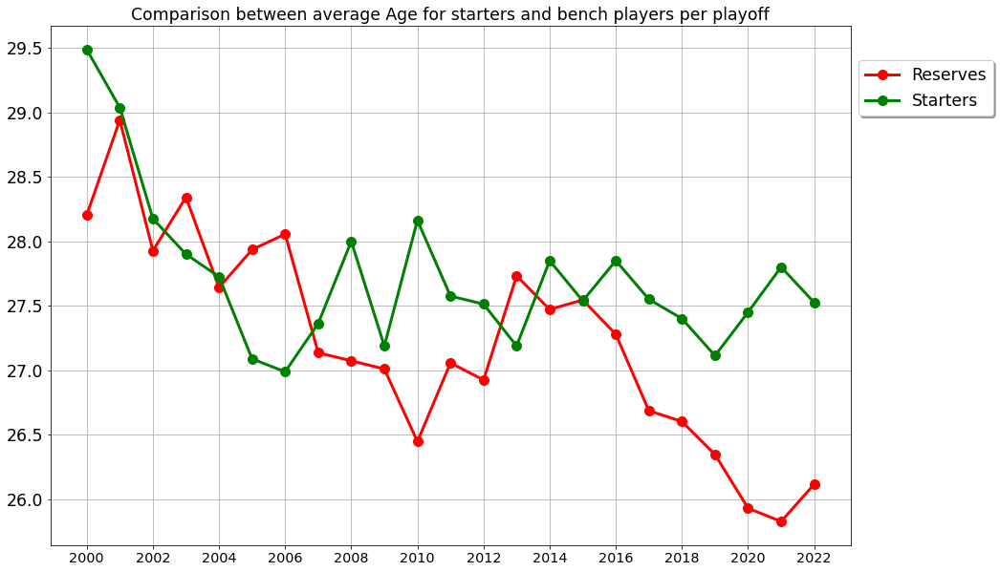

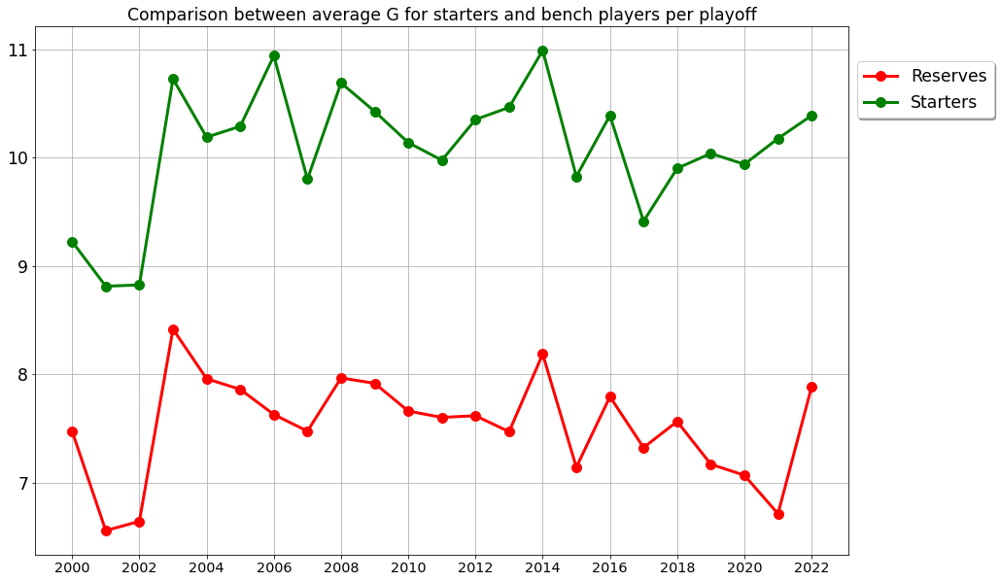

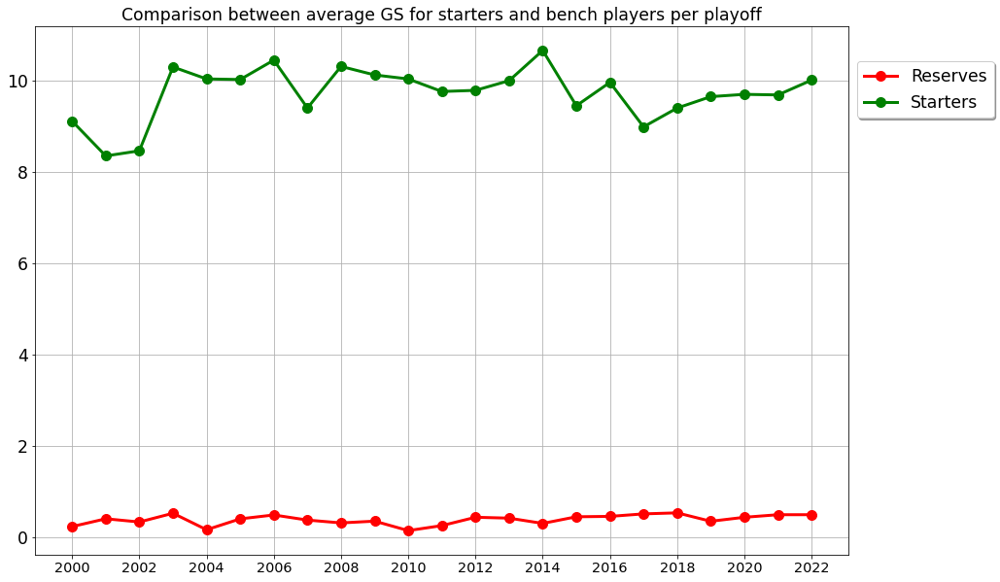

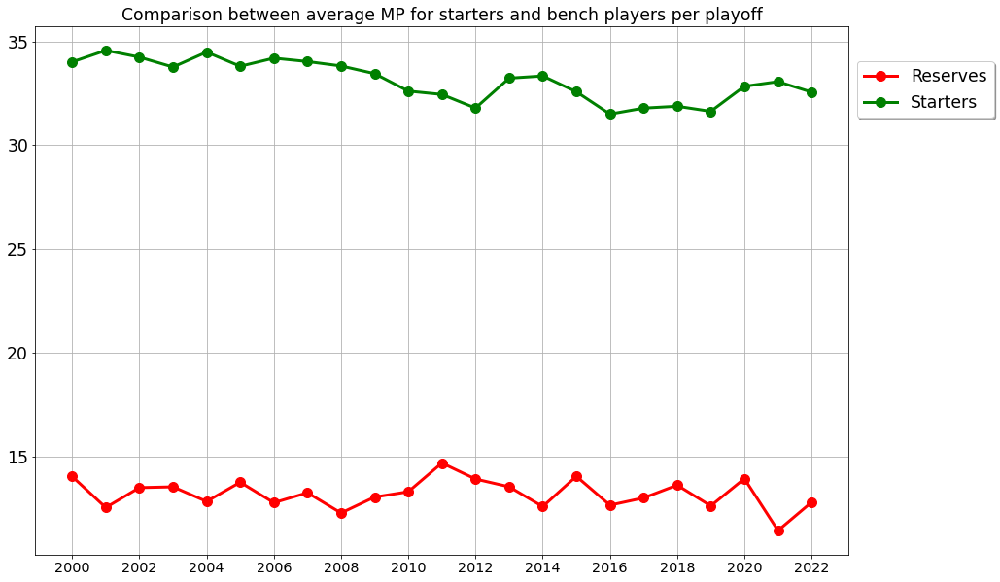

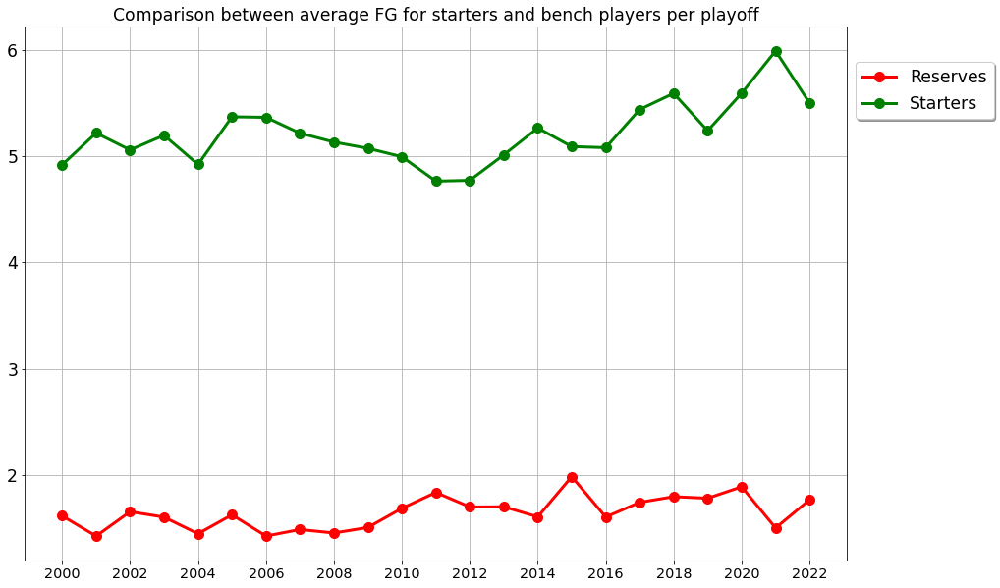

...

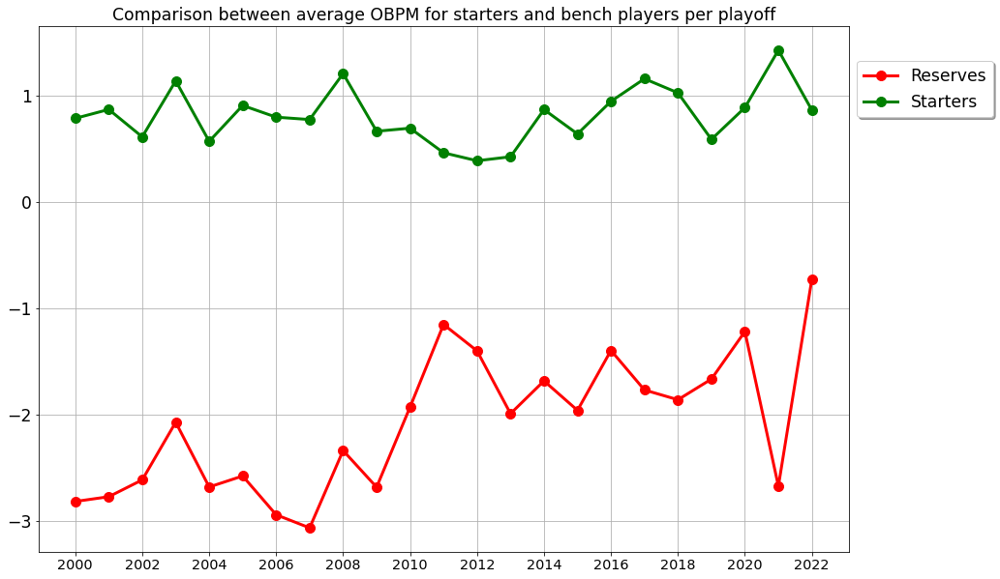

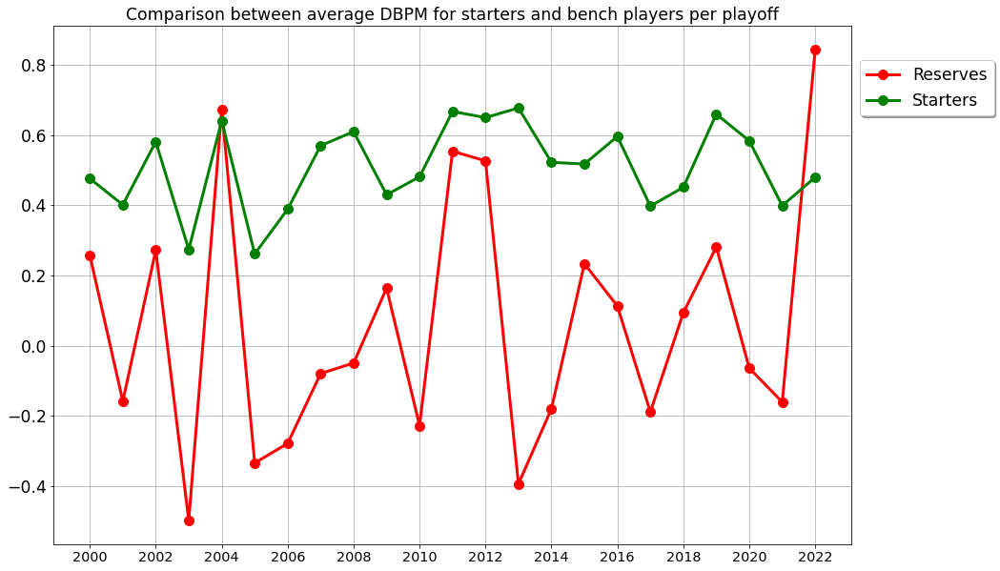

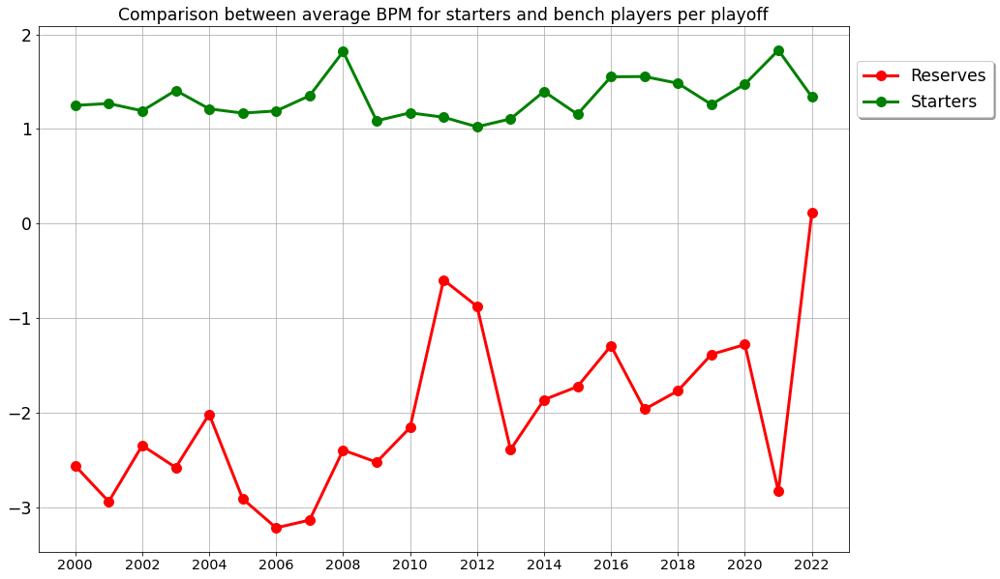

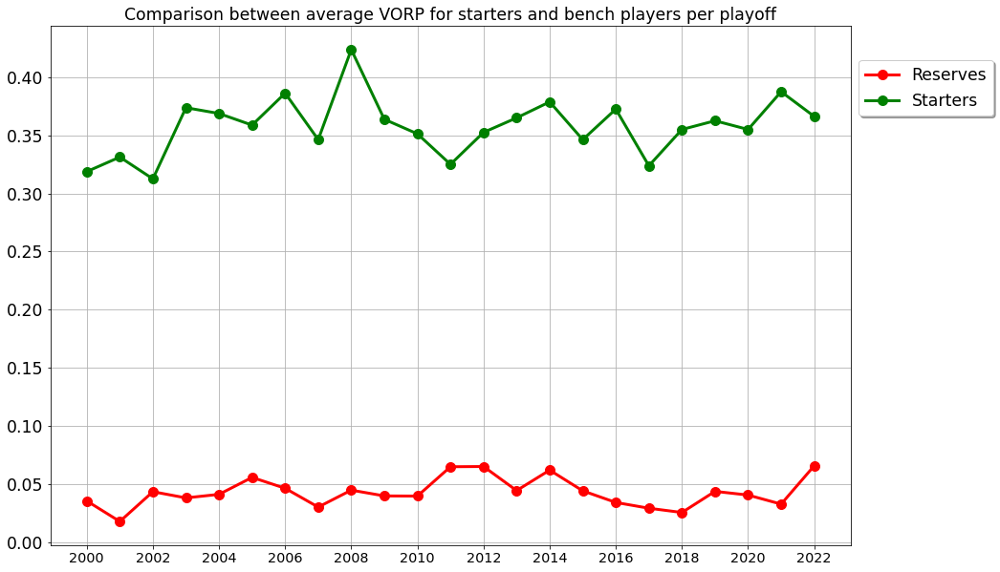

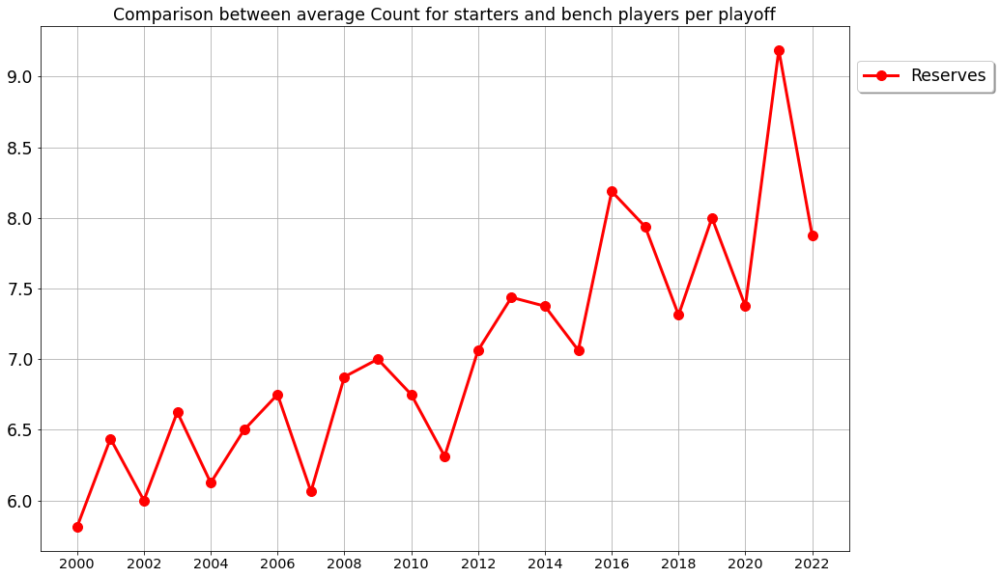

In [52]:
for stat in bench_avg_per_playoff:
    plt.figure(figsize=(15,10))
    plt.grid()
    plt.plot(SEASONS, bench_avg_per_playoff[stat], label="Reserves", lw=3, marker='o', ms=10, c='r')
    if stat != "Count":
        plt.plot(SEASONS, starter_avg_per_playoff[stat], label="Starters", lw=3, marker='o', ms=10, c='g')
    plt.xticks(SEASONS[::2])

    if '/' in stat:
        stat = stat.replace('/', '_')
    plt.title(f"Comparison between average {stat} for starters and bench players per playoff")
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 0.95),
          fancybox=True, shadow=True)
    plt.savefig(f"Results/DepthEvolution_Playoffs/{stat}_starters_and_reserves_each_playoff")
    plt.show()